In [3]:
%load_ext autoreload
%autoreload 2
import numpy as np
import random 
import tensorflow as tf
from matplotlib import pylab as plt
import matplotlib as mpl

In [432]:
def seed(num=123):
    random.seed(num + 123)
    np.random.seed(num + 456)
    tf.random.set_seed(num + 789)

## Linear model : weight direction and bias

In [746]:
from weight import simulation, learn, utils, config
Config = config.Config
x_span = config.Config.x_span
y_span = config.Config.y_span

# checkpoint at each milestone epoch
milestones = [1, 50, 100, 150, 200, 300, 400] 

In [747]:
class Experiment:
    def __init__(self, X, y, verbose=0, lr=0.1, l2=0):
        self.X = X
        self.y = y
        self.lr = lr #1 / np.linalg.svd(X)[1][0]
        self.l2 = l2
        self.verbose = verbose
    
    def class_exp(self, pos, neg, milestone, use_deep=True):
        sample_weight = learn.make_class_weight(self.y, pos, neg)
        return self.sample_exp(sample_weight, milestone, use_deep)
        
    def sample_exp(self, sample_weight, milestone, use_deep=True):
        curve = learn.run_linear(self.X, self.y, sample_weight, 
                                l2=self.l2, 
                                lr=self.lr, 
                                milestones=milestones, 
                                verbose=self.verbose)
        if use_deep:
            model, weights = learn.run_non_linear(X, y, sample_weight, 
                                                    l2=self.l2, 
                                                    lr=self.lr,  
                                                    milestones=milestone, 
                                                    verbose=self.verbose)
        else:
            model, weights = None, None
        return curve, (model, weights)

In [748]:
# generate linear seperable data
X, y = simulation.lin_sep()
margin = learn.get_margin(X, y)
lin_exp = Experiment(X, y)

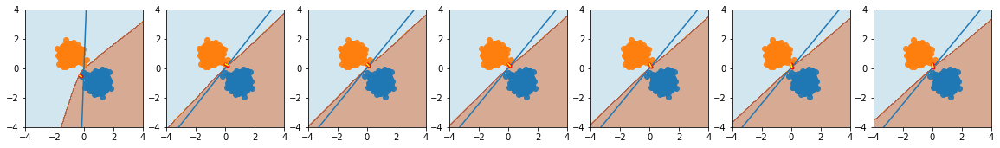

In [749]:
curve, (model, model_weight) = lin_exp.class_exp(0.5, 0.5, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

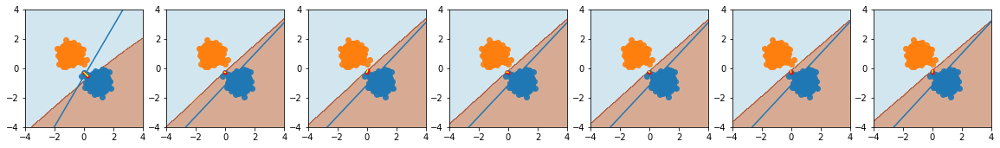

In [750]:
curve, (model, model_weight) = lin_exp.class_exp(0.1, 0.9, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

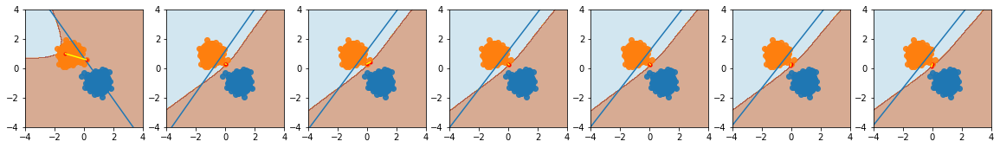

In [751]:
curve, (model, model_weight) = lin_exp.class_exp(0.9, 0.1, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)


In [752]:
X, y = simulation.non_lin_sep()
lin_exp = Experiment(X, y)

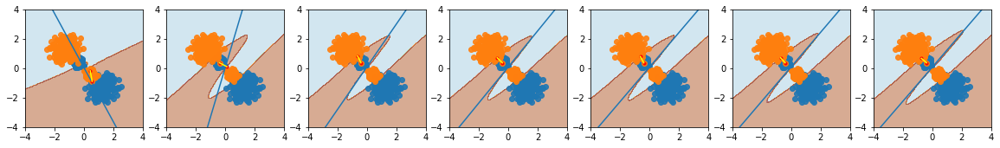

In [753]:
curve, (model, model_weight) = lin_exp.class_exp(0.5, 0.5, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

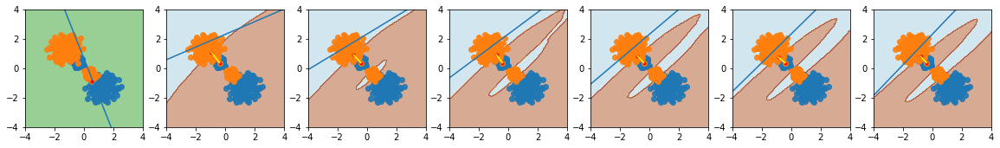

In [754]:
curve, (model, model_weight) = lin_exp.class_exp(0.9, 0.1, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

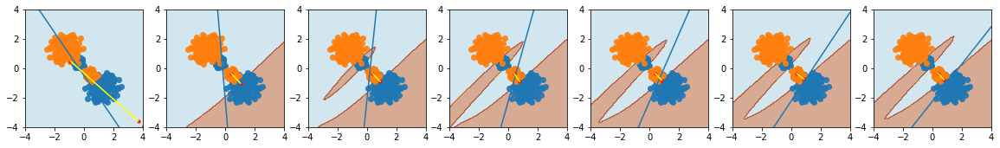

In [755]:
curve, (model, model_weight) = lin_exp.class_exp(0.1, 0.9, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [756]:
X, y = simulation.non_lin_moon()
lin_exp = Experiment(X, y, lr=0.1)

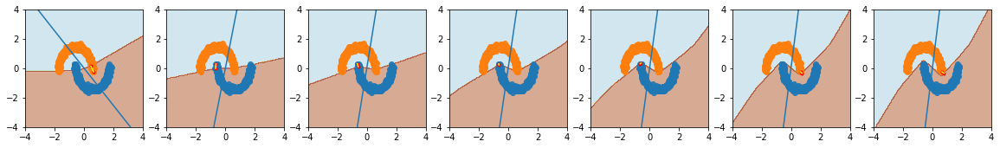

In [757]:
curve, (model, model_weight) = lin_exp.class_exp(0.5, 0.5, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [758]:
((model.predict(X) > 0)[:, 0] == y).mean()

1.0

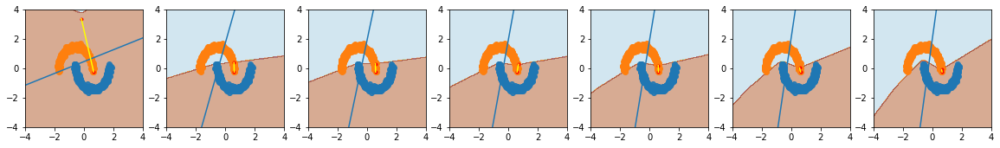

In [759]:
curve, (model, model_weight) = lin_exp.class_exp(0.9, 0.1, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

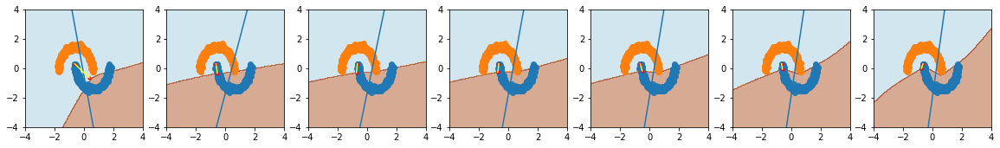

In [760]:
curve, (model, model_weight) = lin_exp.class_exp(0.1, 0.9, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

# Linear model : Convergence speed
We measure the convergence speed by comparing the margins and directions between trained model and the optimal solutions gained from SVM with hard-margin since the data is linear separable.

In [591]:
# common milestones with increasing gap between epochs
milestones = []
step, gap = 1, 1
while step < 300:
    milestones.append(step)
    gap += 0.5
    step += int(gap)

## Linear separable data

In [614]:
# generate linear seperable data
seed(222)
sigmoid = lambda x: np.exp(x) / (1 + np.exp(x))
X, y = simulation.lin_sep()
xx, yy = np.meshgrid(x_span, y_span)
margin = learn.get_margin(X, y)
lin_exp = Experiment(X, y, lr=0.1, verbose=0)

In [615]:
from sklearn import svm
clf = svm.SVC(kernel='linear', C=1000)
clf.fit(X, y)
func_margins = 2 * (y - 0.5) * clf.decision_function(X)
min_gem_maring = min(gem_margins)
sample_weight = sigmoid(func_margins)
optimal_dir = clf.coef_ / np.linalg.norm(clf.coef_)
assert(sum(func_margins < 0) == 0)
class_weights = [(0.5, 0.5), (0.1, 0.9), (0.9, 0.1)]

### With class specific weight

In [616]:
curve_cache = {}
for weight in class_weights:
    curve, (_, _) = lin_exp.class_exp(weight[0], weight[1], milestones, use_deep=False)
    curve_cache[weight] = curve

In [617]:
lin_margin_exp = {}
for weight in class_weights:
    margins = utils.get_linear_margin(X, y, xx, yy, curve_cache[weight])
    lin_margin_exp[weight] = margins

### with weight generated by SVM

In [618]:
from sklearn import svm
clf = svm.SVC(kernel='linear', C=1000)
clf.fit(X, y)
func_margins = 2 * (y - 0.5) * clf.decision_function(X)
min_gem_maring = min(gem_margins)
sample_weight = sigmoid(1/func_margins)
optimal_dir = clf.coef_ / np.linalg.norm(clf.coef_)
assert(sum(func_margins < 0) == 0)

* margin comparison

In [619]:
opt_svm_curves, (opt_svm_mlp, opt_svm_mlp_weights) = lin_exp.sample_exp(sample_weight, milestones, use_deep=True)
opt_svm_margins = utils.get_linear_margin(X, y, xx, yy, opt_svm_curves)

In [620]:
result = utils.preprocess_deep(X, y, x_span, y_span, opt_svm_mlp, opt_svm_mlp_weights)
opt_svm_mlp_margins = [x[1] for x in result]

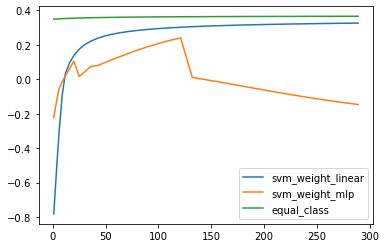

In [621]:
plt.plot(milestones, opt_svm_margins, label='svm_weight_linear')
plt.plot(milestones, opt_svm_mlp_margins, label='svm_weight_mlp')
plt.plot(milestones, lin_margin_exp[(0.5, 0.5)], label='equal_class')
#plt.plot(milestones, lin_margin_exp[(0.1, 0.9)], label='one_sided')

plt.legend()

* Angle comparison

In [622]:
lin_angle_exp = {}
for weight in class_weights:
     coefs_arr = np.array([x[0] for x in curve_cache[weight]])
     coefs_arr = np.squeeze(coefs_arr)
     coefs_arr = coefs_arr / np.linalg.norm(coefs_arr, axis=1)[:, np.newaxis]
     lin_angle_exp[weight] = coefs_arr.dot(optimal_dir.T)

opt_svm_arr = np.array([x[0] for x in opt_svm_curves])
opt_svm_arr = np.squeeze(opt_svm_arr)
opt_svm_arr = opt_svm_arr / np.linalg.norm(opt_svm_arr, axis=1)[:, np.newaxis]
opt_svp_angle = opt_svm_arr.dot(optimal_dir.T)

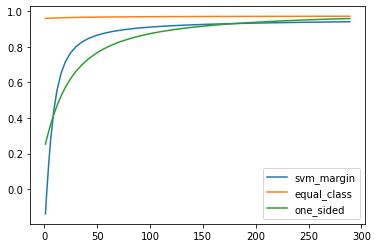

In [623]:
plt.plot(milestones,  opt_svp_angle, label='svm_margin')
plt.plot(milestones,  lin_angle_exp[(0.5, 0.5)], label='equal_class')
plt.plot(milestones,  lin_angle_exp[(0.1, 0.9)], label='one_sided')
plt.legend()

## Non linear separable data

In [551]:
# generate linear seperable data
seed()
X, y = simulation.non_lin_sep()
xx, yy = np.meshgrid(x_span, y_span)
#margin = learn.get_margin(X, y)
nonlin_exp = Experiment(X, y, lr=0.05, verbose=0)

### With class specific weight

In [552]:
class_weights = [(0.5, 0.5), (0.1, 0.9), (0.9, 0.1)]
model_cache = {}
for weight in class_weights:
    curve, (model, weights) = nonlin_exp.class_exp(weight[0], weight[1], milestones, use_deep=True)
    model_cache[weight] = (model, weights)

In [555]:
lin_margin_exp = {}
for weight in class_weights:
    model, model_weights = model_cache[weight]
    result = utils.preprocess_deep(X, y, x_span, y_span, model, model_weights)
    lin_margin_exp[weight] = [x[1] for x in result]

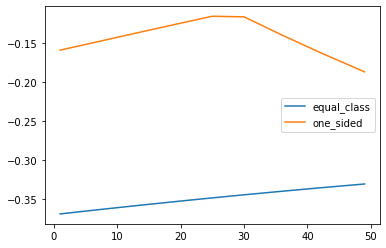

In [556]:
#plt.plot(milestones, opt_svm_margins, label='svm_margin')
plt.plot(milestones, lin_margin_exp[(0.5, 0.5)], label='equal_class')
plt.plot(milestones, lin_margin_exp[(0.1, 0.9)], label='one_sided')
plt.legend()